In [14]:
#Import the data and display the head, shape and description of the data:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

df = pd.read_excel('aspiring_minds_employability_outcomes_2015.xlsx')

print(df.head())
print(df.shape)
print(df.describe())


  Unnamed: 0      ID   Salary        DOJ                  DOL  \
0      train  203097   420000 2012-06-01              present   
1      train  579905   500000 2013-09-01              present   
2      train  810601   325000 2014-06-01              present   
3      train  267447  1100000 2011-07-01              present   
4      train  343523   200000 2014-03-01  2015-03-01 00:00:00   

                Designation    JobCity Gender        DOB  10percentage  ...  \
0   senior quality engineer  Bangalore      f 1990-02-19          84.3  ...   
1         assistant manager     Indore      m 1989-10-04          85.4  ...   
2          systems engineer    Chennai      f 1992-08-03          85.0  ...   
3  senior software engineer    Gurgaon      m 1989-12-05          85.6  ...   
4                       get    Manesar      m 1991-02-27          78.0  ...   

  ComputerScience  MechanicalEngg  ElectricalEngg TelecomEngg  CivilEngg  \
0              -1              -1              -1         

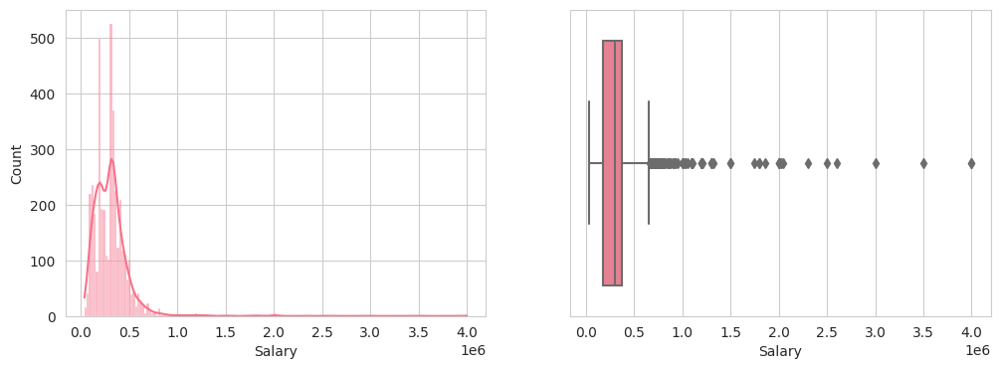

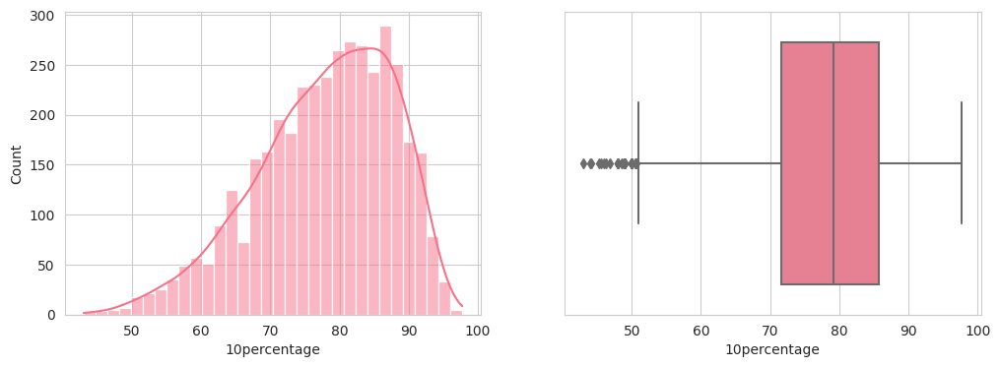

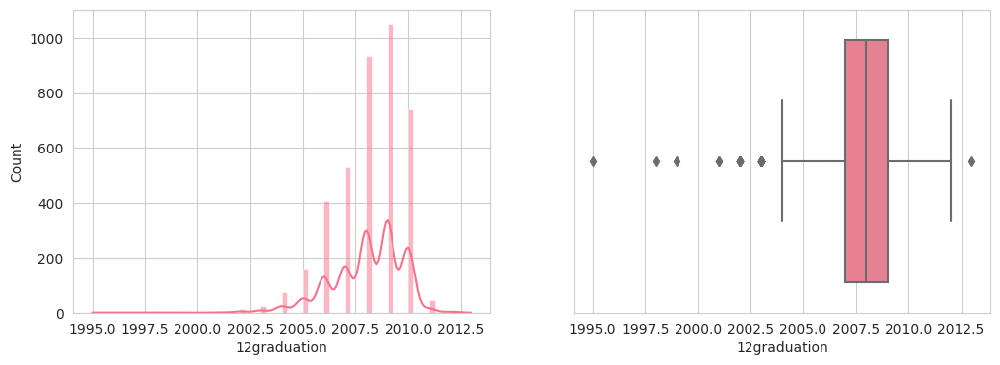

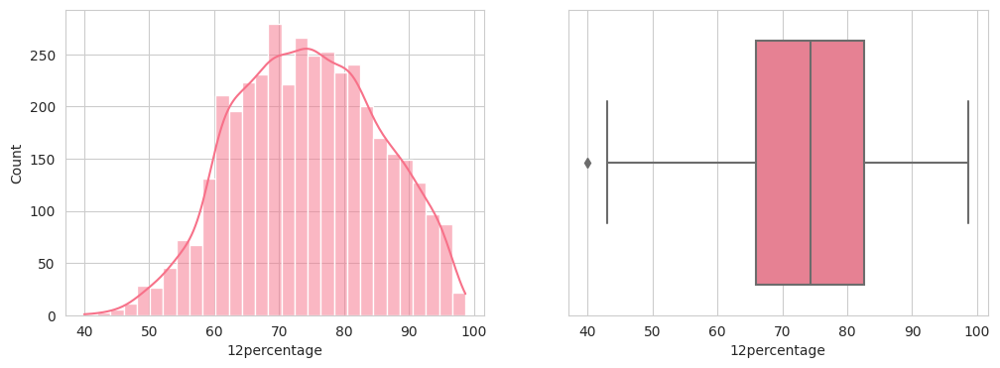

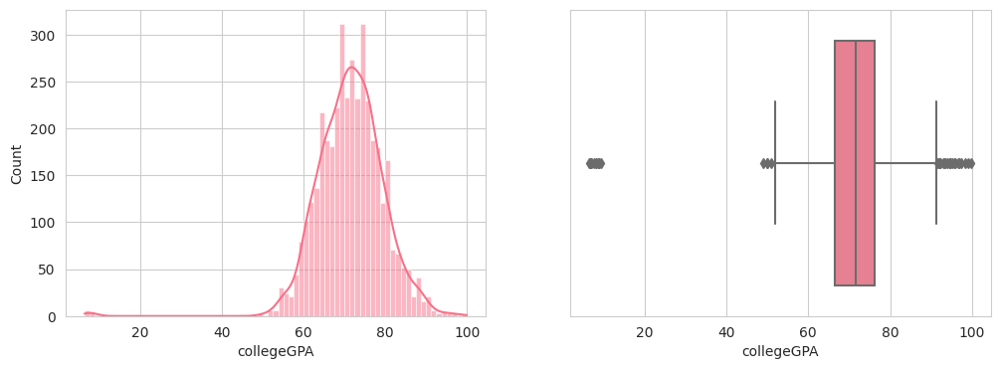

...

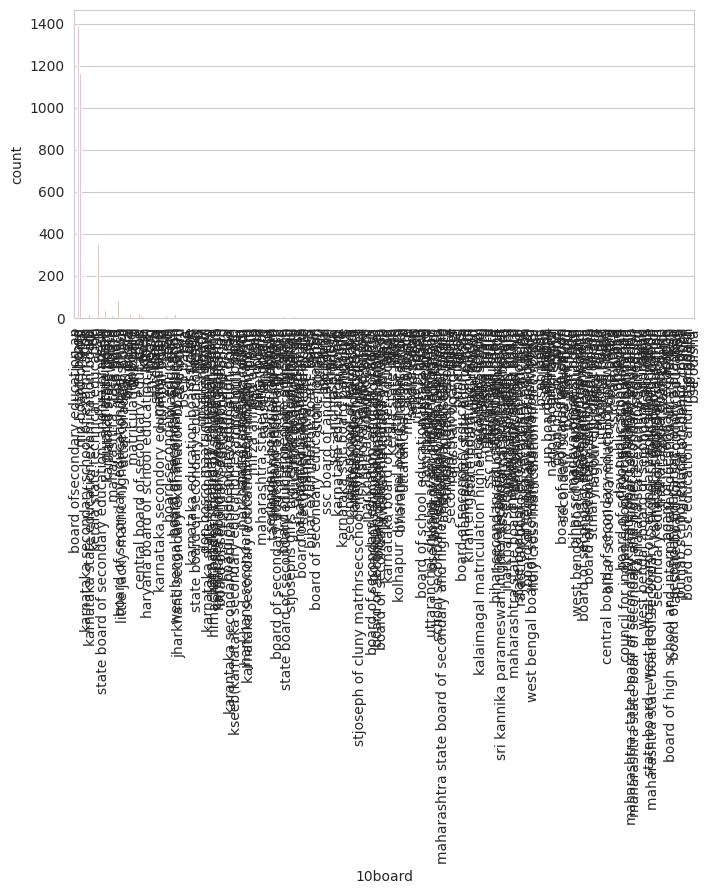

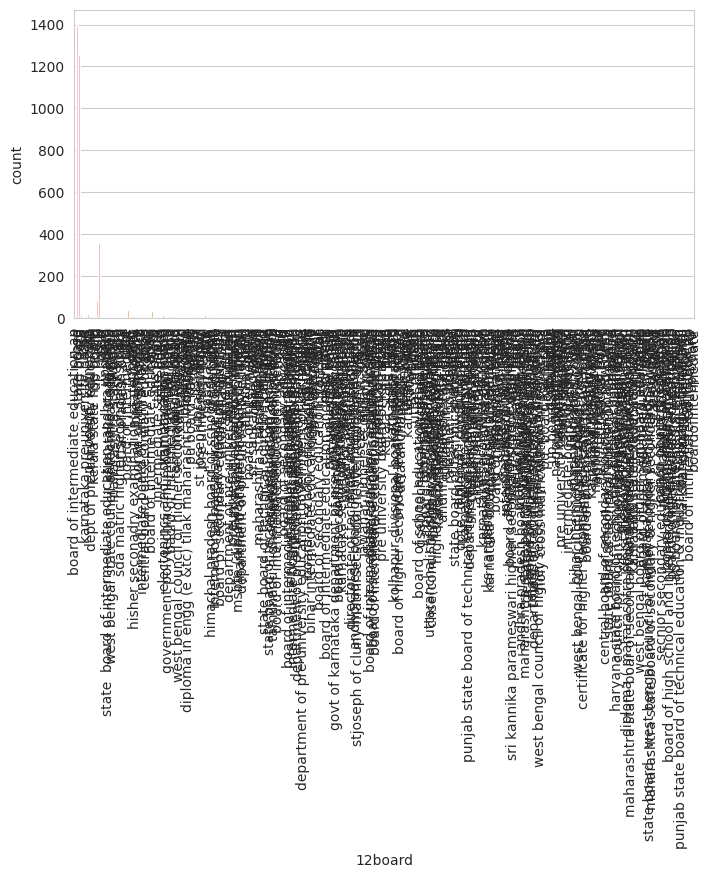

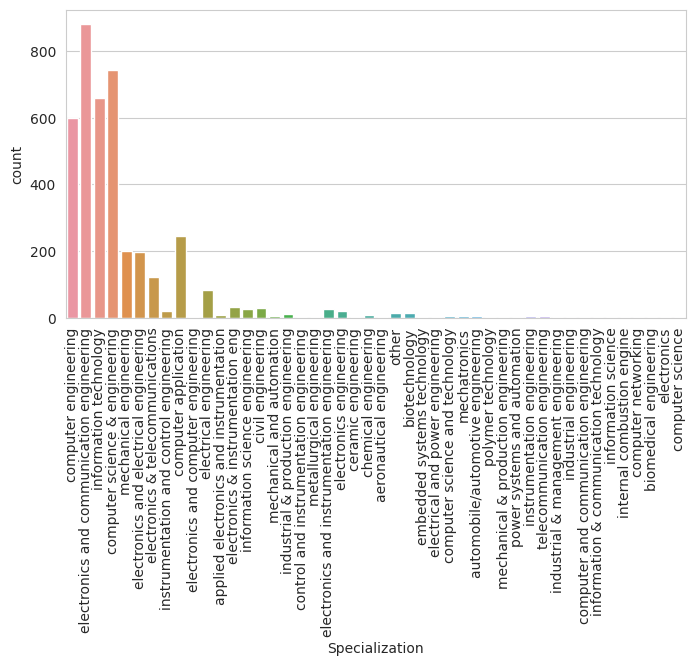

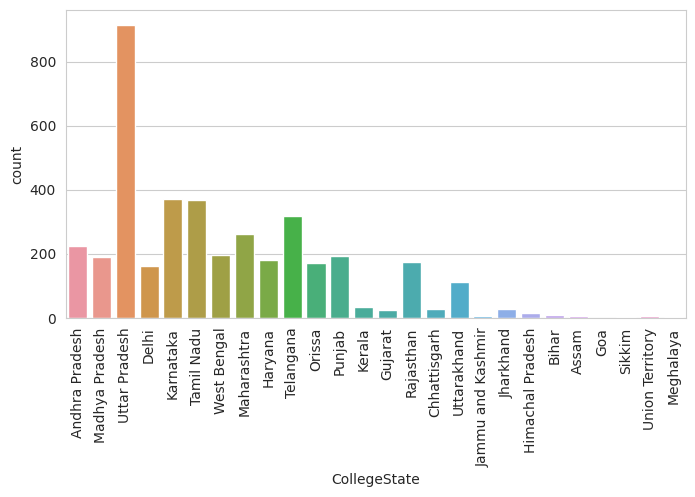

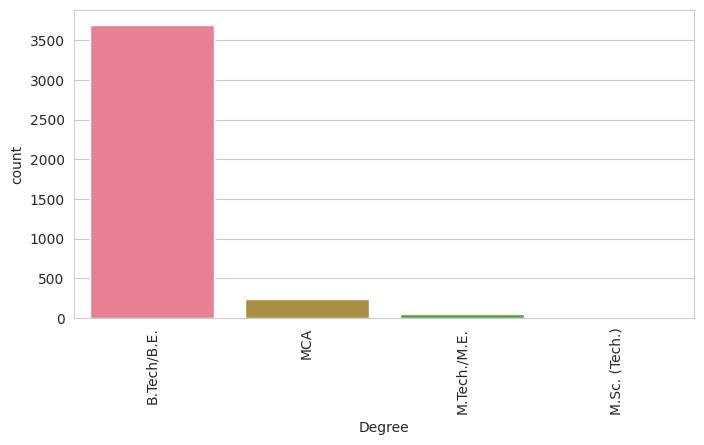

In [16]:
#univariate analysis
sns.set_style("whitegrid")
sns.set_palette("husl")
numerical_cols = ['Salary', '10percentage', '12graduation', '12percentage', 'collegeGPA', 'GraduationYear', 'English', 'Logical', 'Quant', 'Domain', 'ComputerProgramming', 'ElectronicsAndSemicon', 'ComputerScience', 'MechanicalEngg', 'ElectricalEngg', 'TelecomEngg', 'CivilEngg', 'conscientiousness', 'agreeableness', 'extraversion', 'nueroticism', 'openess_to_experience']

categorical_cols = ['Gender', '10board', '12board', 'Specialization', 'CollegeState', 'Degree']

# Histograms and Boxplots for numerical variables
for col in numerical_cols:
    fig, axs = plt.subplots(1, 2, figsize=(12,4))
    sns.histplot(data=df, x=col, ax=axs[0], kde=True)
    sns.boxplot(data=df, x=col, ax=axs[1])
    plt.show()

# Countplots for categorical variables
for col in categorical_cols:
    fig, axs = plt.subplots(figsize=(8,4))
    sns.countplot(data=df, x=col)
    plt.xticks(rotation=90)
    plt.show()


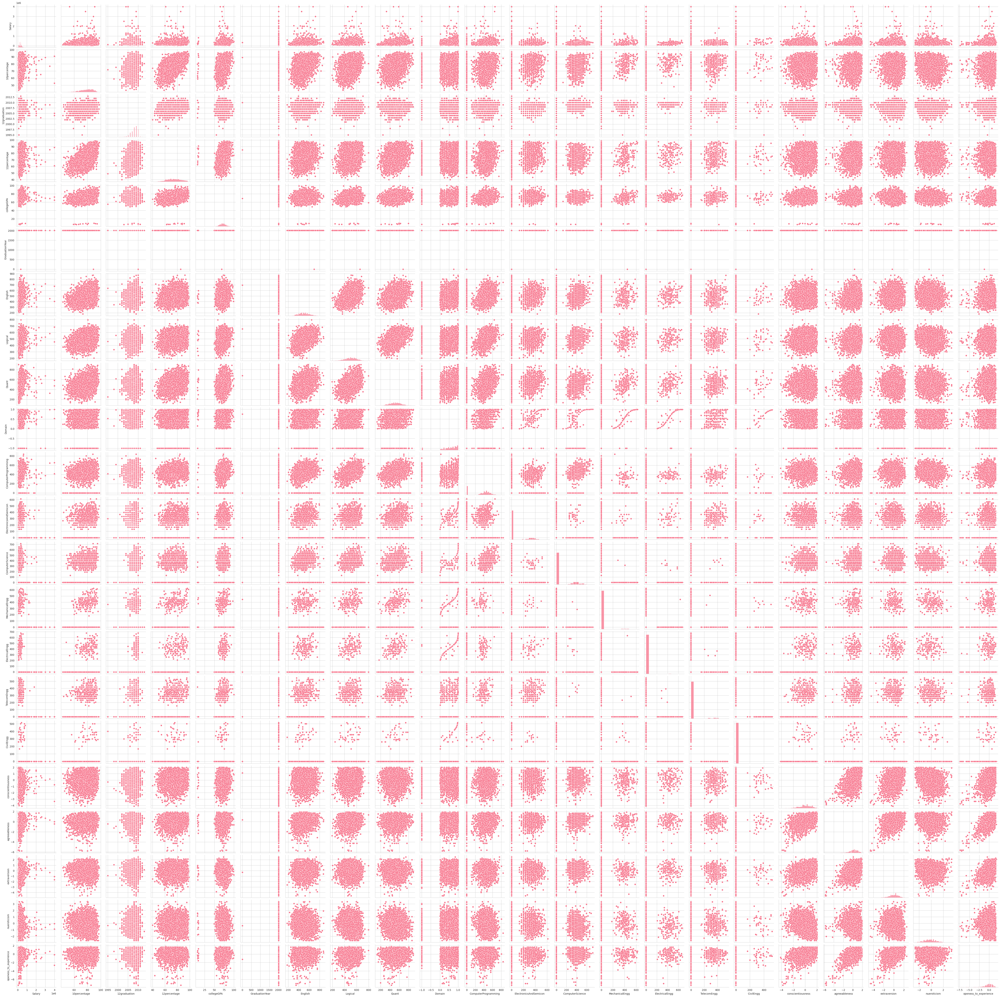

In [24]:
#Bivariate analysis
sns.pairplot(data=df[numerical_cols], diag_kind='hist')
plt.show()


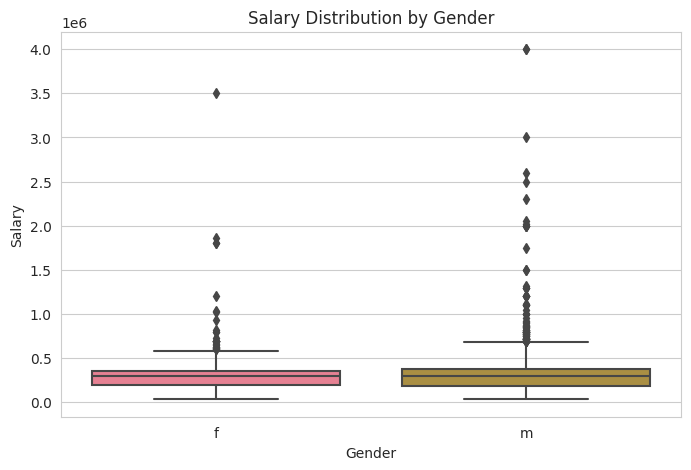

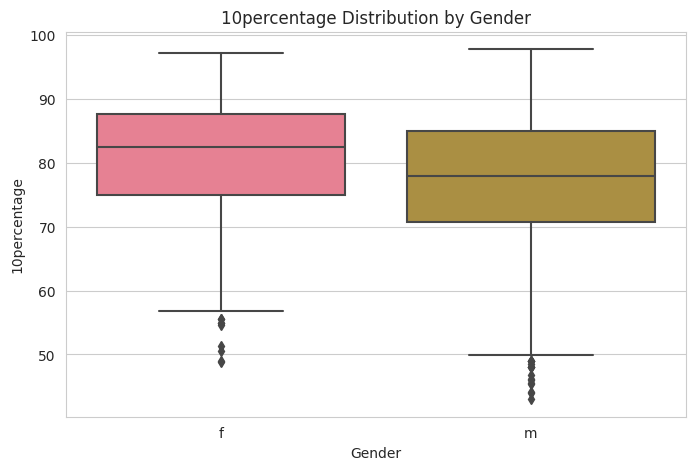

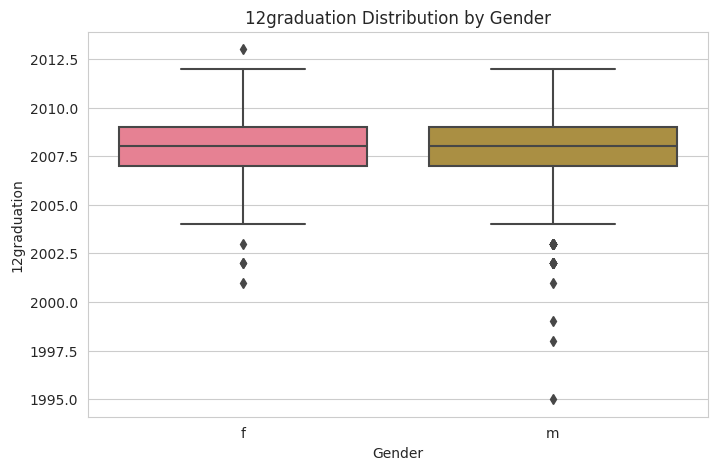

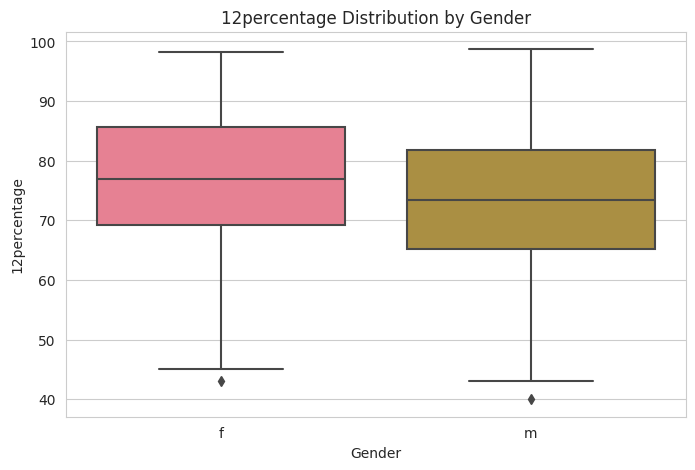

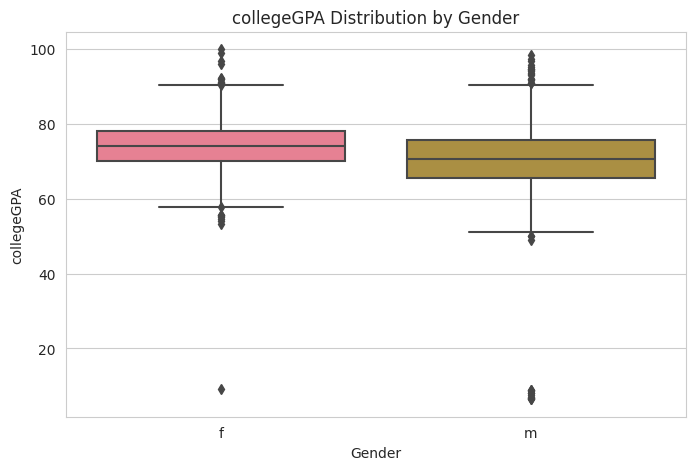

...

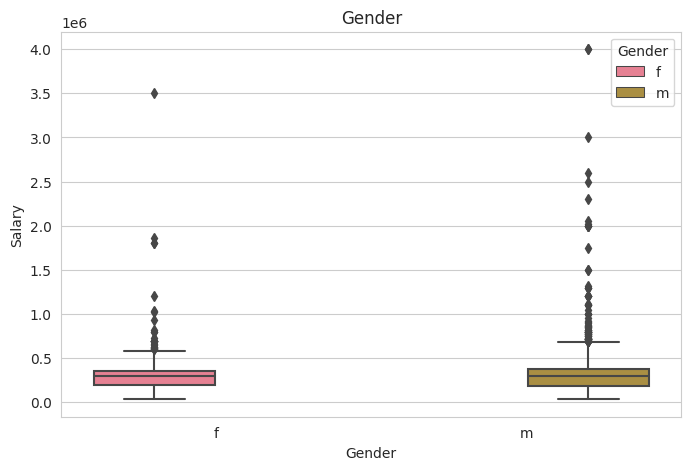

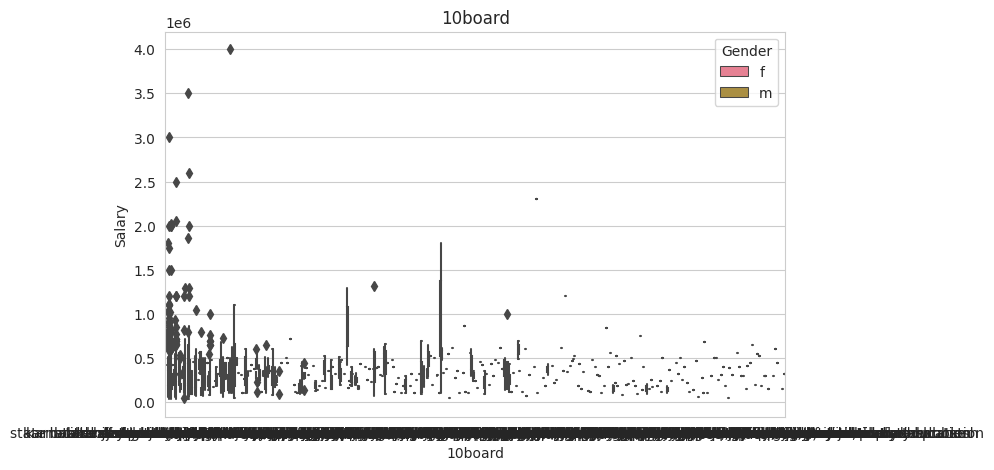

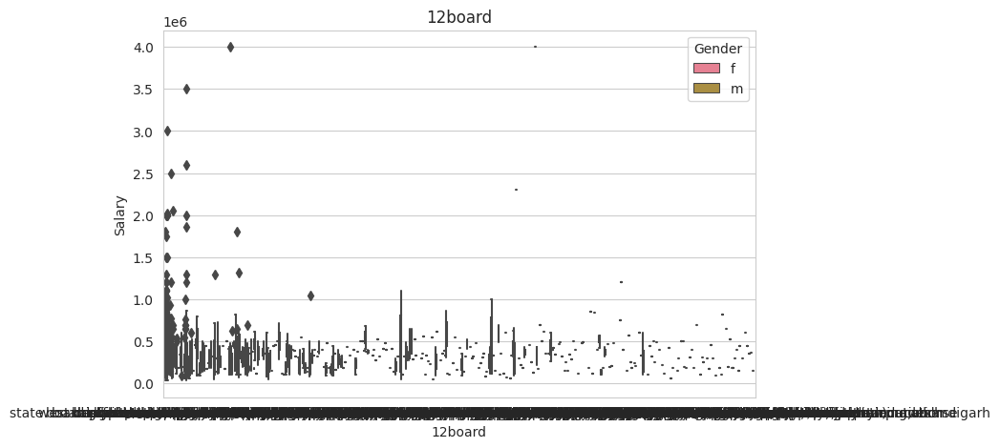

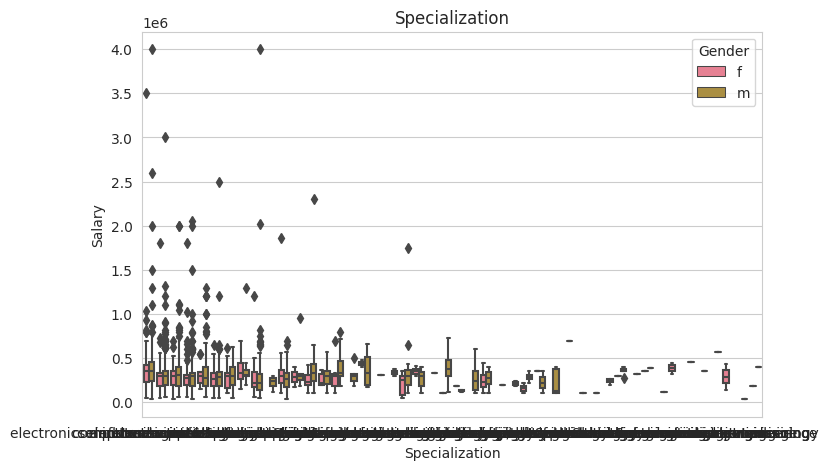

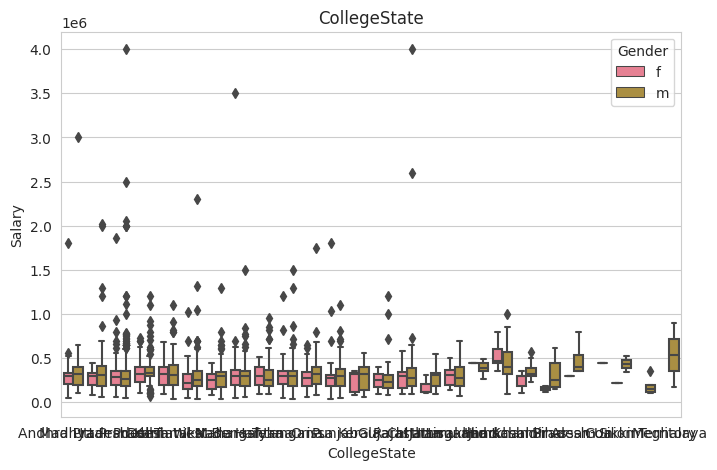

In [32]:
#plotting the relationship between the categorical and numerical columns.
for col in numerical_cols:
    plt.figure(figsize=(8, 5))
    df[col].fillna(df[col].median(), inplace=True)  # Fill missing values with median
    sns.boxplot(data=df, x='Gender', y=col)
    plt.title(f'{col} Distribution by Gender')
    plt.show()



for col in categorical_cols[:-1]:
    plt.figure(figsize=(8, 5))
    sns.boxplot(data=df, x=col, y='Salary', hue='Gender')
    plt.title(col)
    plt.show()



In [33]:
df.columns


Index(['Unnamed: 0', 'ID', 'Salary', 'DOJ', 'DOL', 'Designation', 'JobCity',
       'Gender', 'DOB', '10percentage', '10board', '12graduation',
       '12percentage', '12board', 'CollegeID', 'CollegeTier', 'Degree',
       'Specialization', 'collegeGPA', 'CollegeCityID', 'CollegeCityTier',
       'CollegeState', 'GraduationYear', 'English', 'Logical', 'Quant',
       'Domain', 'ComputerProgramming', 'ElectronicsAndSemicon',
       'ComputerScience', 'MechanicalEngg', 'ElectricalEngg', 'TelecomEngg',
       'CivilEngg', 'conscientiousness', 'agreeableness', 'extraversion',
       'nueroticism', 'openess_to_experience'],
      dtype='object')

In [43]:
#Research question
# Group data by job and calculate mean salary for each group
job_salary = df.groupby('Designation')['Salary'].mean()

# Print mean salaries for each job
print(job_salary)


# Compare with claim made in the article
print("\nClaim: After doing your Computer Science Engineering if you take up jobs as a Programming Analyst, Software Engineer, Hardware Engineer and Associate Engineer you can earn up to 2.5-3 lakhs as a fresh graduate.")


Designation
.net developer                   223382.352941
.net web developer               196250.000000
account executive                287500.000000
account manager                  350000.000000
admin assistant                  102500.000000
                                     ...      
web designer and seo             200000.000000
web developer                    168981.481481
web intern                       205000.000000
website developer/tester         200000.000000
windows systems administrator    200000.000000
Name: Salary, Length: 419, dtype: float64

Claim: After doing your Computer Science Engineering if you take up jobs as a Programming Analyst, Software Engineer, Hardware Engineer and Associate Engineer you can earn up to 2.5-3 lakhs as a fresh graduate.


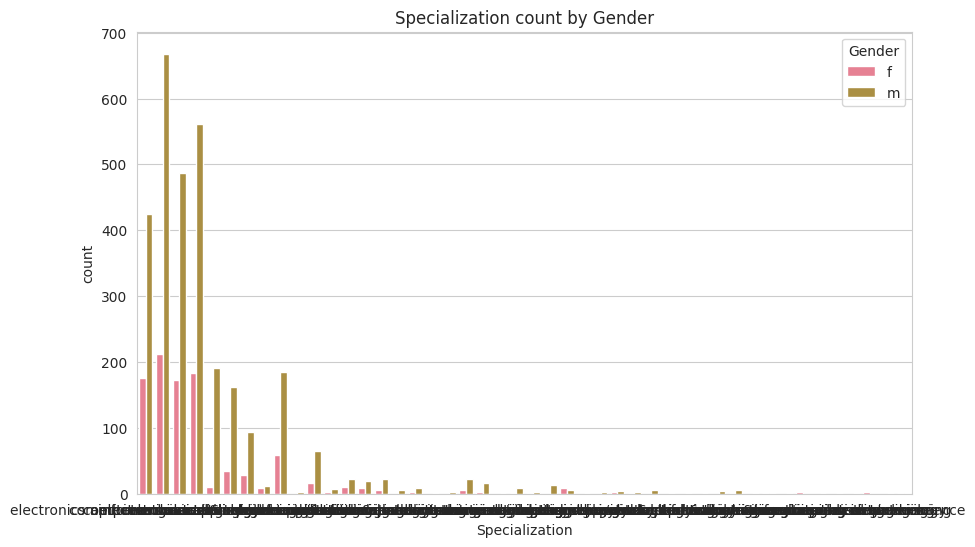

In [47]:
 #code to create the countplot:
 plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='Specialization', hue='Gender')
plt.title('Specialization count by Gender')
plt.show()
